# WorldBank

Questo notebook mostra delle tecniche e metodologie per lavorare con dati mai visti prima, in particolare dati provenienti da API pubbliche come quella del World Bank.

Nel notebook viene mostrato come scaricare i dati, elaborarli e visualizzarli. 

Si parte da un approccio più semplice, facendo delle prove per esplorare il funzionamento del codice mentre si lavora sui dati, per poi passare a un approccio più strutturato e modulare.

Si conclude con un esempio di animazione di un grafico scatter plot, per mostrare l'evoluzione di alcuni indicatori nel tempo.

In [1]:
link_countries = "http://api.worldbank.org/countries/?format=json&per_page=400"

In [ ]:
# %pip install requests

In [ ]:
# cominciamo dalle basi delle chiamate API
import requests

response = requests.get(link_countries)
response


In [ ]:
requests.codes.ok # più leggibile rispetto ad un 200 scritto fisso che potremmo non comprendere in futuro

200

In [9]:
response.status_code == requests.codes.ok #diventa la condizione della mia if

True

In [ ]:
def get_data_from_link(link):
    # per completezza potremmo usare try/except
    response = requests.get(link)
    if response.status_code == requests.codes.ok:
        return response.json()[1] # questa API restituisce un json, dal quale serve solo il secondo elemento
    else:
        print('Error - status:', response.status_code, '-', response.reason)

In [ ]:
countries = get_data_from_link(link_countries)
countries

In [2]:
# %pip install pandas

In [ ]:
# tentiamo di importare i dati in pandas
import pandas as pd

df_countries = pd.DataFrame(countries)
df_countries

,id,iso2Code,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude
0,ABW,AW,Aruba,"{'id': 'LCN', 'iso2code': 'ZJ', 'value': 'Lati...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'HIC', 'iso2code': 'XD', 'value': 'High...","{'id': 'LNX', 'iso2code': 'XX', 'value': 'Not ...",Oranjestad,-70.0167,12.5167
1,AFE,ZH,Africa Eastern and Southern,"{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': 'Aggregates'}",,,
2,AFG,AF,Afghanistan,"{'id': 'MEA', 'iso2code': 'ZQ', 'value': 'Midd...","{'id': 'MNA', 'iso2code': 'XQ', 'value': 'Midd...","{'id': 'LIC', 'iso2code': 'XM', 'value': 'Low ...","{'id': 'IDX', 'iso2code': 'XI', 'value': 'IDA'}",Kabul,69.1761,34.5228
3,AFR,A9,Africa,"{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': 'Aggregates'}",,,
4,AFW,ZI,Africa Western and Central,"{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': 'Aggregates'}",,,
...,...,...,...,...,...,...,...,...,...,...
291,XZN,A5,Sub-Saharan Africa excluding South Africa and ...,"{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': 'Aggregates'}",,,
292,YEM,YE,"Yemen, Rep.","{'id': 'MEA', 'iso2code': 'ZQ', 'value': 'Midd...","{'id': 'MNA', 'iso2code': 'XQ', 'value': 'Midd...","{'id': 'LIC', 'iso2code': 'XM', 'value': 'Low ...","{'id': 'IDX', 'iso2code': 'XI', 'value': 'IDA'}",Sana'a,44.2075,15.352
293,ZAF,ZA,South Africa,"{'id': 'SSF', 'iso2code': 'ZG', 'value': 'Sub-...","{'id': 'SSA', 'iso2code': 'ZF', 'value': 'Sub-...","{'id': 'UMC', 'iso2code': 'XT', 'value': 'Uppe...","{'id': 'IBD', 'iso2code': 'XF', 'value': 'IBRD'}",Pretoria,28.1871,-25.746
294,ZMB,ZM,Zambia,"{'id': 'SSF', 'iso2code': 'ZG', 'value': 'Sub-...","{'id': 'SSA', 'iso2code': 'ZF', 'value': 'Sub-...","{'id': 'LMC', 'iso2code': 'XN', 'value': 'Lowe...","{'id': 'IDX', 'iso2code': 'XI', 'value': 'IDA'}",Lusaka,28.2937,-15.3982


In [ ]:
#poniamo attenzione ai dati (json annidati, "paesi" aggregati...)
df_countries[df_countries['name']=="World"]

,id,iso2Code,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude
288,WLD,1W,World,"{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': ''}","{'id': 'NA', 'iso2code': 'NA', 'value': 'Aggre...","{'id': '', 'iso2code': '', 'value': 'Aggregates'}",,,


In [49]:
#riduciamo il volume di dati

#torniamo indietro sulla creazione del dataframe
df_countries = pd.json_normalize(countries)

column_select = ['iso2Code', 'name', 'region.value']
df_countries = df_countries[column_select]
df_countries = df_countries.rename({'iso2Code': 'Id', 'name':'Country', 'region.value': 'Region'}, axis='columns')
df_countries = df_countries.set_index('Id')
df_countries

,Country,Region
Id,,
AW,Aruba,Latin America & Caribbean
ZH,Africa Eastern and Southern,Aggregates
AF,Afghanistan,"Middle East, North Africa, Afghanistan & Pakistan"
A9,Africa,Aggregates
ZI,Africa Western and Central,Aggregates
...,...,...
A5,Sub-Saharan Africa excluding South Africa and ...,Aggregates
YE,"Yemen, Rep.","Middle East, North Africa, Afghanistan & Pakistan"
ZA,South Africa,Sub-Saharan Africa


In [ ]:
# usiamo string.format() per sostituire i placeholders in string (analogo ad usare f-string):

# LINK_FORMAT = "http://api.worldbank.org/countries/all/indicators/{}/?format=json&date=1960:2024&per_page=20000"
# link_population_tot = "SP.POP.TOTL"
# requests.get(LINK_FORMAT.format(link_population_tot))

# requests.get(f"http://api.worldbank.org/countries/all/indicators/{link_population_tot}/?format=json&date=1960:2024&per_page=20000")

In [ ]:
# cosa fa dict.keys(): 
column_dict = {'date': 'Year', 'value': "Population", 'country.id': 'CountryId'}
column_dict.keys()
# list(column_dict.keys())

dict_keys(['date', 'value', 'country.id'])

In [ ]:
# adesso recuperiamo i dati della popolazione sftuttando la tecnica impiegata per la dimensione Countries
LINK_FORMAT = "http://api.worldbank.org/countries/all/indicators/{}/?format=json&date=1960:2024&per_page=20000"
link_population_tot = "SP.POP.TOTL"

link = LINK_FORMAT.format(link_population_tot)
df = get_data_from_link(link)
if df: 
    df_data = pd.json_normalize(df)
    # column_select = ['date', 'value', 'country.id']
    column_dict = {'date': 'Year', 'value': "Population", 'country.id': 'CountryId'}
    df_data = df_data[column_dict.keys()].rename(columns=column_dict) #filtro selezionando solo le colonne presenti nel dict e rinomino
df_data

,Year,Population,CountryId
0,2024,769294618.0,ZH
1,2023,750503764.0,ZH
2,2022,731821393.0,ZH
3,2021,713090928.0,ZH
4,2020,694446100.0,ZH
...,...,...,...
17285,1964,4320006.0,ZW
17286,1963,4185877.0,ZW
17287,1962,4055959.0,ZW
17288,1961,3930401.0,ZW


In [64]:
df_data.describe()

,Population
count,1.719500e+04
mean,2.182465e+08
std,7.142278e+08
min,2.715000e+03
25%,1.019463e+06
50%,6.790788e+06
75%,4.706578e+07
max,8.142056e+09


In [63]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17290 entries, 0 to 17289
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Year        17290 non-null  object 
 1   Population  17195 non-null  float64
 2   CountryId   17290 non-null  object 
dtypes: float64(1), object(2)
memory usage: 405.4+ KB


In [ ]:
# l'indice è per CountryId e Year
df_data['idx'] = df_data[['CountryId', 'Year']].apply(''.join, axis='columns')
# df_data['idx'] = df_data['CountryId'] + df_data['Year']
df_data = df_data.set_index('idx')
df_data


,Year,Population,CountryId
idx,,,
ZH2024,2024,769294618.0,ZH
ZH2023,2023,750503764.0,ZH
ZH2022,2022,731821393.0,ZH
ZH2021,2021,713090928.0,ZH
ZH2020,2020,694446100.0,ZH
...,...,...,...
ZW1964,1964,4320006.0,ZW
ZW1963,1963,4185877.0,ZW
ZW1962,1962,4055959.0,ZW


In [ ]:
link_indicator = {
    "SP.POP.TOTL": "Population",
    "SP.DYN.LE00.IN": "Life Expectancy"
}

print(link_indicator.items())

for x in link_indicator.items():
    print(x)

for indicator_col, name in link_indicator.items():
    print(indicator_col, name)

dict_items([('SP.POP.TOTL', 'Population'), ('SP.DYN.LE00.IN', 'Life Expectancy')])
('SP.POP.TOTL', 'Population')
('SP.DYN.LE00.IN', 'Life Expectancy')
SP.POP.TOTL Population
SP.DYN.LE00.IN Life Expectancy


In [ ]:
# prendiamo due indicatori e facciamo merge
LINK_FORMAT = "http://api.worldbank.org/countries/all/indicators/{}/?format=json&date=1960:2024&per_page=20000"
link_indicator = {
    "SP.POP.TOTL": "Population",
    "SP.DYN.LE00.IN": "Life Expectancy",
    "SP.DYN.TFRT.IN": "Fertility Rate"
}

#dataframe vuoto in cui fare la merge
df_wb_data = pd.DataFrame()

for indicator_col, name in link_indicator.items():
    link = LINK_FORMAT.format(indicator_col)
    df = get_data_from_link(link)
    if df: 
        df_data = pd.json_normalize(df)
        column_dict = {'date': 'Year', 'value': name, 'country.id': 'CountryId'}
        df_data = df_data[column_dict.keys()].rename(columns=column_dict) #filtro selezionando solo le colonne presenti nel dict e rinomino

        if not df_wb_data.empty:
            df_wb_data = df_wb_data.merge(df_data, how='outer', on=['CountryId', 'Year'])
        else:
            df_wb_data = df_data
df_wb_data

,Year,Population,CountryId,Life Expectancy,Fertility Rate
0,1960,91540853.0,1A,44.794056,6.922033
1,1961,93931683.0,1A,45.545371,6.972142
2,1962,96428599.0,1A,45.993769,7.075062
3,1963,99038509.0,1A,46.979338,7.066516
4,1964,101729760.0,1A,47.570034,7.040109
...,...,...,...,...,...
17285,2020,15526888.0,ZW,61.530000,3.754000
17286,2021,15797210.0,ZW,60.135000,3.765000
17287,2022,16069056.0,ZW,62.360000,3.767000
17288,2023,16340822.0,ZW,62.775000,3.724000


In [ ]:
# join dei due dataframe
df_all = df_wb_data.set_index('CountryId').join(df_countries).reset_index()
df_all

,CountryId,Year,Population,Life Expectancy,Fertility Rate,Country,Region
0,1A,1960,91540853.0,44.794056,6.922033,Arab World,Aggregates
1,1A,1961,93931683.0,45.545371,6.972142,Arab World,Aggregates
2,1A,1962,96428599.0,45.993769,7.075062,Arab World,Aggregates
3,1A,1963,99038509.0,46.979338,7.066516,Arab World,Aggregates
4,1A,1964,101729760.0,47.570034,7.040109,Arab World,Aggregates
...,...,...,...,...,...,...,...
17285,ZW,2020,15526888.0,61.530000,3.754000,Zimbabwe,Sub-Saharan Africa
17286,ZW,2021,15797210.0,60.135000,3.765000,Zimbabwe,Sub-Saharan Africa
17287,ZW,2022,16069056.0,62.360000,3.767000,Zimbabwe,Sub-Saharan Africa
17288,ZW,2023,16340822.0,62.775000,3.724000,Zimbabwe,Sub-Saharan Africa


## Analisis of World Bank Data

### Example: Animated Scatter Plot

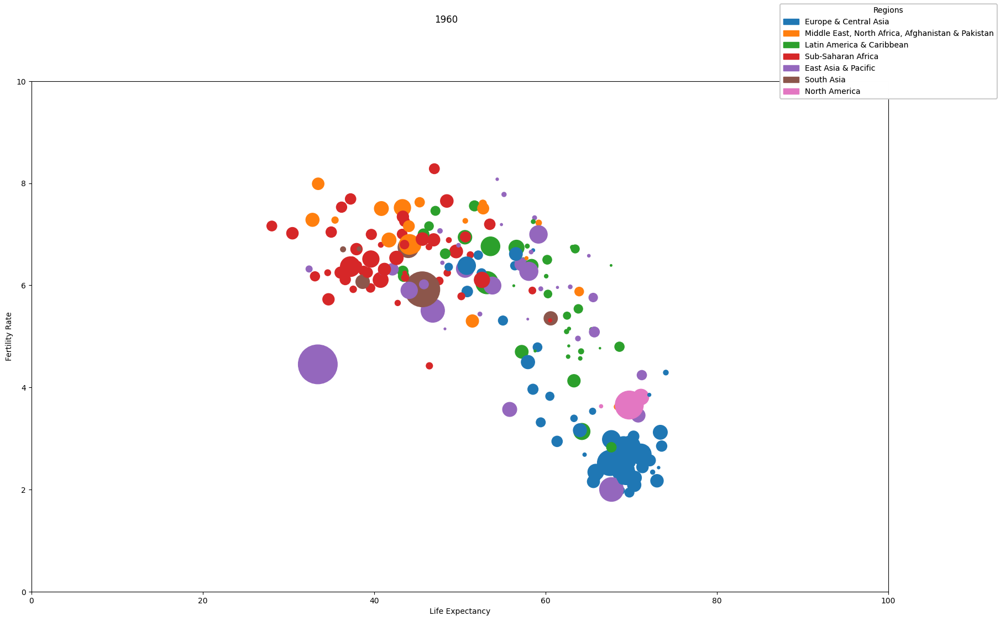

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.animation as animation
import numpy as np
from functools import partial
from IPython import display

def animate(year, df:pd.DataFrame, fig:plt.Figure, ax:plt.Axes):
    # year = dates[i]
    df_by_year = df[df['Year'] == year]

    colors, regions = pd.factorize(df_by_year['Region'])
    colors = [plt.cm.tab10(i) for i in colors] # uso un colormap "tab10"
    handles = [patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(regions)]

    ax.cla()
    fig.suptitle(year)
    fig.legend(handles=handles, title='Regions')
    ax.set_xlim(0.,100.)
    ax.set_ylim(0.,10)
    ax.set_xlabel(df_by_year['Life Expectancy'].name)
    ax.set_ylabel(df_by_year['Fertility Rate'].name)
    
    ax.scatter(df_by_year['Life Expectancy'], df_by_year['Fertility Rate'], s=np.sqrt(df_by_year['Population'])/10, c=colors)

df_noAggregates = df_all[df_all['Region'] != "Aggregates"]
dates = df_noAggregates.groupby(df_noAggregates['Year'])['Year'].groups.keys()

fig, ax = plt.subplots(figsize=(20,12))
anim = animation.FuncAnimation(fig, partial(animate, df=df_noAggregates, fig=fig, ax=ax), frames=dates, interval=1000, repeat=False)
from IPython.display import HTML
HTML(anim.to_jshtml())

### Region plots

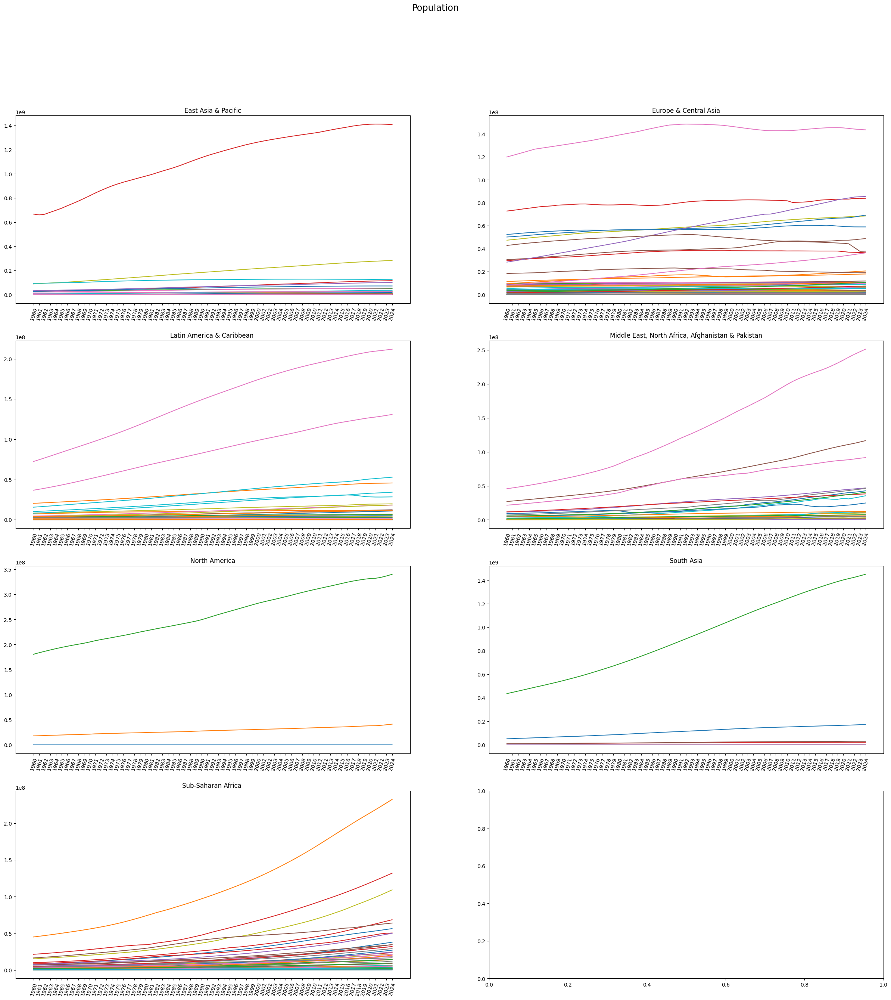

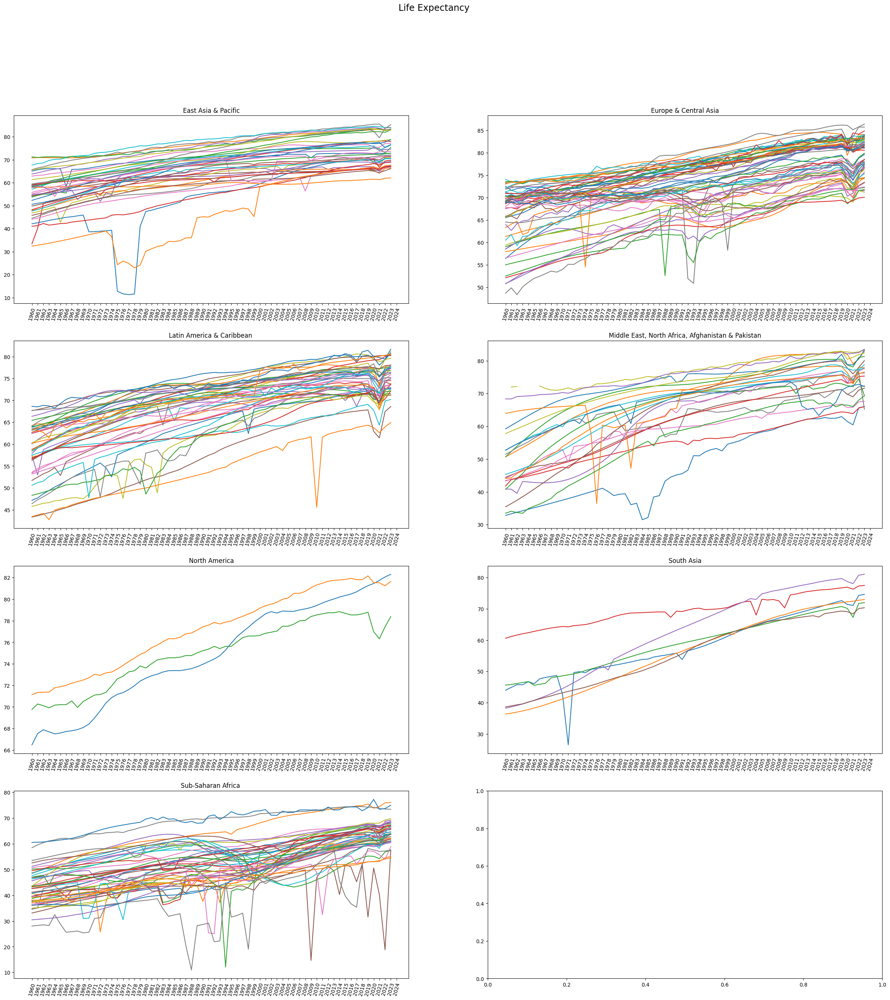

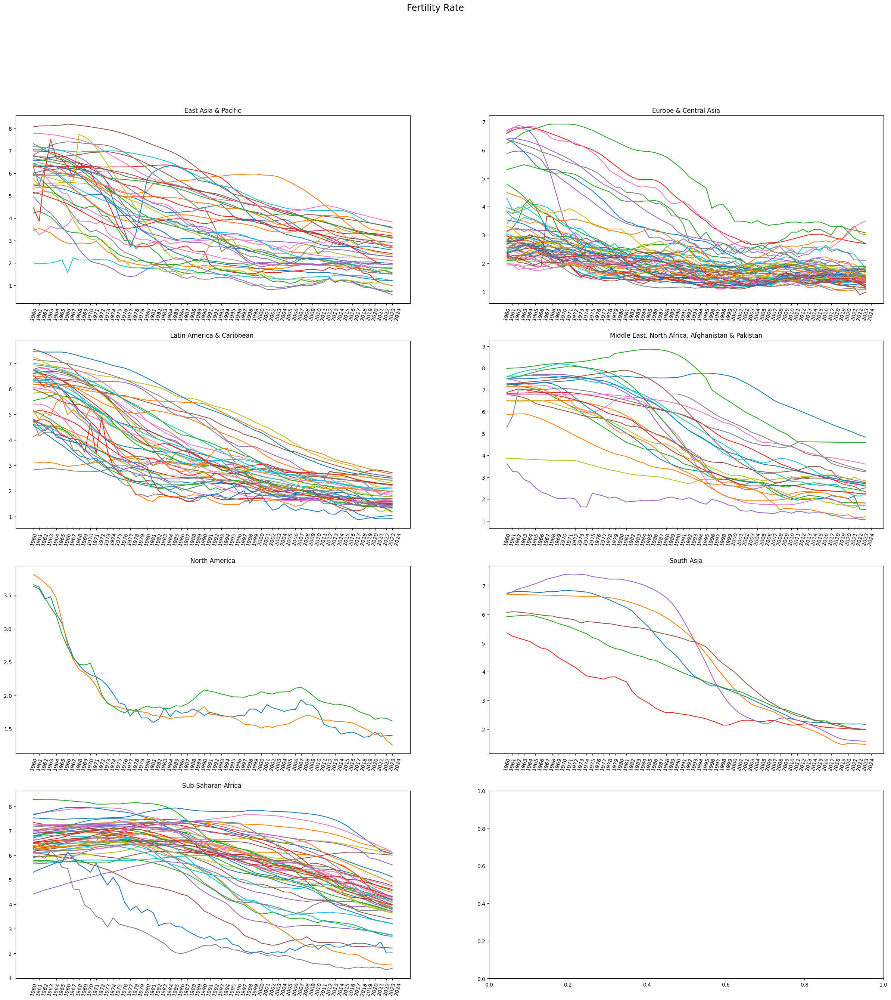

In [108]:
import matplotlib.pyplot as plt

for _, indicator_col in link_indicator.items():
    ax_idx=0
    regions = df_countries.groupby(df_countries['Region'])
    region_plots = (len(regions.count())+1)//2
    fig, axes = plt.subplots(region_plots, 2, figsize=(30,30))
    fig.suptitle(indicator_col, fontsize='xx-large')

    for region, df_region in regions:
        if region == "Aggregates":
            continue
        ax:plt.Axes = axes[ax_idx//2][ax_idx%2]
        ax_idx+=1
        country_ids = df_region.index
        ax.set_title(region)
        for country_id in country_ids:
            plot_data = df_noAggregates[df_noAggregates['CountryId']==country_id].sort_values(by='Year')
            country_name = df_countries.loc[country_id, 'Country']
            ax.plot(plot_data['Year'], plot_data[indicator_col], label=country_name)
            ax.tick_params(axis='x', labelrotation=75)
        